In [111]:
import tarfile
tar_path = 'data/'
ball_video_path = 'Vid_A_ball.tar.xz'
# cup_video_path = 'Vid_B_cup.tar.xz'
# person_video_path = 'Vid_D_person.tar.xz'
extract_to = 'data'

with tarfile.open(tar_path+ball_video_path) as f:
    f.extractall(extract_to)
    
# with tarfile.open(tar_path+cup_video_path) as f:
#     f.extractall(extract_to)
    
# with tarfile.open(tar_path+person_video_path) as f:
#     f.extractall(extract_to)

In [1]:
import torch
x = torch.rand(1, 2, 3, 3)
l= torch.rand(1, 1, 3, 3)
th = torch.Tensor([0.5])  # threshold
l = (l > th).float() * 1
print(x.shape)
print(x)
print(l)
l = l.view(-1)
x = torch.transpose(x, 0, 2)
x = torch.transpose(x, 1, 3)
x = x.reshape(-1, 2) 
print(x)
print(l)
# x = x.view(-1, x.shape[-1]*x.shape[-2])

torch.Size([1, 2, 3, 3])
tensor([[[[0.3544, 0.6113, 0.1818],
          [0.7511, 0.2558, 0.8896],
          [0.4790, 0.0530, 0.4654]],

         [[0.1317, 0.2158, 0.3126],
          [0.1632, 0.1466, 0.4095],
          [0.9404, 0.3089, 0.1985]]]])
tensor([[[[0., 0., 0.],
          [0., 1., 0.],
          [0., 0., 0.]]]])
tensor([[0.3544, 0.1317],
        [0.6113, 0.2158],
        [0.1818, 0.3126],
        [0.7511, 0.1632],
        [0.2558, 0.1466],
        [0.8896, 0.4095],
        [0.4790, 0.9404],
        [0.0530, 0.3089],
        [0.4654, 0.1985]])
tensor([0., 0., 0., 0., 1., 0., 0., 0., 0.])


In [97]:
%matplotlib inline
from matplotlib import pyplot as plt
import cv2
import numpy as np

## Save Centroids

In [98]:
import pickle
def save_centroids(path):
    with open(path,'wb') as f:
        pickle.dump(centroids, f)
def load_centroids(path):
    centroids = None
    with open(path,'rb') as f:
        centroids = pickle.load(f)
    return centroids

## Load image

(240, 320)


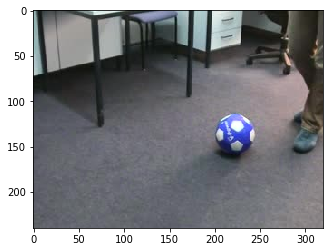

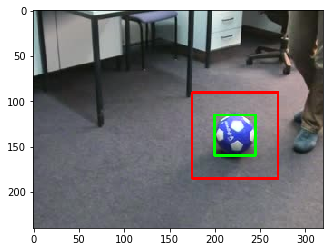

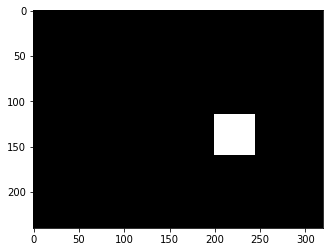

In [3]:
img_path = "./data/Vid_A_ball/img0002.jpg"

#Import image
orig_image = cv2.imread(img_path)
#Show the image with matplotlib
start_point = (200, 115)   
end_point = (245, 160)
padding = 25
start_point_pad = (start_point[0]-padding, start_point[1]-padding)
end_point_pad = (end_point[0]+padding, end_point[1]+padding)
# Blue color in BGR 
color = (0, 255, 0) 
color_pad = (255, 0, 0)
# Line thickness of 2 px 
thickness = 2
image = orig_image.copy()
image = cv2.rectangle(image, start_point, end_point, color, thickness) 
image = cv2.rectangle(image, start_point_pad, end_point_pad, color_pad, thickness) 


# label image
image_labels = np.zeros((orig_image.shape[0], orig_image.shape[1]))
image_labels[start_point[1]:end_point[1], start_point[0]:end_point[0]] = 1.0
print(image_labels.shape)
#Show the image with matplotlib
plt.imshow(orig_image)
plt.show()
plt.imshow(image)
plt.show()
plt.imshow(image_labels, cmap=plt.cm.gray)
plt.show()

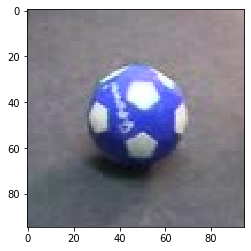

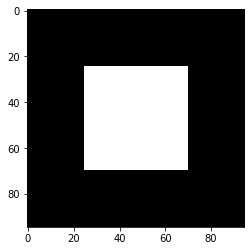

torch.Size([95, 95])
torch.Size([1, 3, 95, 95])
torch.Size([9025])


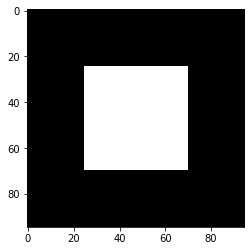

tensor([2400, 2401, 2402,  ..., 6622, 6623, 6624])
tensor([   0,    1,    2,  ..., 9022, 9023, 9024])


In [4]:
import torch

img = orig_image[start_point_pad[1]:end_point_pad[1], start_point_pad[0]:end_point_pad[0]]
plt.imshow(img)
plt.show()

labels = image_labels[start_point_pad[1]:end_point_pad[1], start_point_pad[0]:end_point_pad[0]]
plt.imshow(labels, cmap=plt.cm.gray)
plt.show()

img = np.moveaxis(img, -1, 0)
img = torch.tensor(img)
img = img.float()
img = img.unsqueeze(0)
labels = torch.tensor(labels)

print(labels.shape)
print(img.shape)
flatten_labels = labels.view(-1)
print(flatten_labels.shape)

test_flatten_labels = flatten_labels.reshape((labels.shape[0], labels.shape[1]))

plt.imshow(test_flatten_labels, cmap=plt.cm.gray)
plt.show()

foreground = torch.where(flatten_labels == 1)[0]
background = torch.where(flatten_labels == 0)[0]
print(foreground)
print(background)

In [5]:
import random

def get_pixels_triplets(outputs, labels, batch_size, foreground, background):
    anchors = []
    postives = []
    negatives = []
#     print("len(background):", len(background))
#     print("len(foreground):", len(foreground))
#     print("len(outputs):", len(outputs))
    
    for _ in range(batch_size):
        anchor_label = random.randint(0, 1)
        if anchor_label == 0:
            # choose index from foreground and background
            anchor_idx = random.randrange(0, len(background))
            pos_idx = random.randrange(0, len(background))
            while anchor_idx == pos_idx:
                pos_idx = random.randrange(0, len(background))
            neg_idx = random.randrange(0, len(foreground))
            
            # get real index from outputs 
            anchor_idx = background[anchor_idx]
            pos_idx = background[pos_idx]
            neg_idx = foreground[neg_idx]
            
        elif anchor_label == 1:
            # choose index from foreground and background
            anchor_idx = random.randrange(0, len(foreground))
            pos_idx = random.randrange(0, len(foreground))
            while anchor_idx == pos_idx:
                pos_idx = random.randrange(0, len(foreground))
            neg_idx = random.randrange(0, len(background))
            
            # get real index from outputs
            anchor_idx = foreground[anchor_idx]
            pos_idx = foreground[pos_idx]
            neg_idx = background[neg_idx]
            
        anchors.append(outputs[anchor_idx])
        postives.append(outputs[pos_idx])
        negatives.append(outputs[neg_idx])
    return anchors, postives, negatives

In [6]:
import random

def get_triplet(labels, foreground, background):
    anchor_label = random.randint(0, 1)
    if anchor_label == 0:
        # choose index from foreground and background
        anchor_idx = random.randrange(0, len(background))
        pos_idx = random.randrange(0, len(background))
        while anchor_idx == pos_idx:
            pos_idx = random.randrange(0, len(background))
        neg_idx = random.randrange(0, len(foreground))

        # get real index from outputs 
        anchor_idx = background[anchor_idx]
        pos_idx = background[pos_idx]
        neg_idx = foreground[neg_idx]

    elif anchor_label == 1:
        # choose index from foreground and background
        anchor_idx = random.randrange(0, len(foreground))
        pos_idx = random.randrange(0, len(foreground))
        while anchor_idx == pos_idx:
            pos_idx = random.randrange(0, len(foreground))
        neg_idx = random.randrange(0, len(background))

        # get real index from outputs
        anchor_idx = foreground[anchor_idx]
        pos_idx = foreground[pos_idx]
        neg_idx = background[neg_idx]
    return anchor_idx, pos_idx, neg_idx

In [7]:
import time
from tqdm import tqdm
import copy

def train_model(model, criterion, image, labels, optimizer, foreground, background, num_epochs=25, batch_size=16, num_batches=1):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    model.to(device)
    image = image.to(device)
    model.train()
    min_run_loss = np.inf
    best_model_wts = None
    for epoch in tqdm(range(num_epochs), desc="Epochs"):
        running_loss = []
        for _ in range(batch_size*num_batches):
            optimizer.zero_grad()
            outputs = model(image)
            anchor_idx, pos_idx, neg_idx = get_triplet(labels, foreground, background)
            loss = criterion(outputs, anchor_idx, pos_idx, neg_idx)
            loss.backward()
            optimizer.step()
            running_loss.append(loss.cpu().detach().numpy())
        mean_run_loss = np.mean(running_loss)
        print('loss: {:4f}'.format(mean_run_loss))
        if min_run_loss > mean_run_loss:
            min_run_loss = mean_run_loss
            best_model_wts = copy.deepcopy(model.state_dict())

    print('Best val loss: {:4f}'.format(min_run_loss))

    model.load_state_dict(best_model_wts)
    return model

def get_centroids(embeddings, foreground, background):
    centroid_background = embeddings[background].sum(0, keepdims=True) / len(background)
    centroid_foreground = embeddings[foreground].sum(0, keepdims=True) / len(foreground)
    return [centroid_background, centroid_foreground]

def embeddings_accuracy(embeddings, targets, shape, centriods, num_classes=2):
    correct = 0
    wrong = 0
    heat_map = np.zeros(len(embeddings))
    for i in range(num_classes):
        inds = np.where(targets==i)[0]
        for emb_idx, point in enumerate(embeddings[inds]):
            min_dist = np.inf
            min_dist_class = -1
            for class_idx, c in enumerate(centriods):
                dist = np.linalg.norm(c-point)
                if(dist < min_dist):
                    # print("point: ({}, {}) which in class {}, closer to centroid: ({}, {}) which in class {}".format(x, y, i, c[0], c[1], idx))
                    min_dist_class = class_idx
                    min_dist = dist
                    heat_map[inds[emb_idx]] = class_idx
            if(i == min_dist_class):
                correct += 1
            else:
                wrong += 1
    print("correct: {}, wrong: {}, accuracy: {}%".format(correct, wrong, (100.0*correct)/(correct + wrong)))
    heat_map = heat_map.reshape(shape)
    return heat_map

In [8]:
import random as rd
import pandas as pd
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_PCA(embeddings, targets, out_features_size, classes, flat_first=False, is_3D=False,colors=None, pca_title='My PCA Graph', xlim=None, ylim=None, draw_PCA_per_varc=False, figure_size=(10,10), top_range_loadingfactors=None):
    # Generate random colors for each class
    if colors == None:
        colors = []
        r = lambda: rd.randint(0, 200) # (0, 255) not 255 to avoid colors diff than white
        for _ in range(len(classes)):
            colors.append('#%02X%02X%02X' % (r(),r(),r()))
    assert(len(colors) == len(classes))

    # First center and scale the data
    # After centering avg value for each gene will be 0
    # After scaling std for each gene will be 1
    embeddings_indecies = ['embedding' + str(i) for i in range(1, len(embeddings[0])+1)]
    df = pd.DataFrame(columns=embeddings_indecies, index=np.arange(1, len(embeddings)+1))
    for i in range(out_features_size):
        df.loc[:, embeddings_indecies[i]] = embeddings[:, i]
    # print(df.head())
    # print("Shape:", df.shape)
                          
    # scaled_data = preprocessing.scale(df.T) if(samples_are_columns) else preprocessing.scale(df)
    scaled_data = preprocessing.scale(df)
    pca = PCA()
    pca.fit(scaled_data) # calc loading scores for every pca
    pca_data = pca.transform(scaled_data) # generate coordinates    
    per_var = np.round(pca.explained_variance_ratio_*100, decimals=1) # Percentage of Explained Variance in %
    # labels to PCA number corresponding to Percentage of Explained Variance
    labels = ['PC' + str(i) for i in range(1, len(per_var)+1)] 
    
    # plot scree plot of loading factors 
    if draw_PCA_per_varc:
        plt.figure(figsize=figure_size)
        plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
        plt.ylabel('Percentage of Explained Variance')
        plt.xlabel('Principal Component')
        plt.title('Scree Plot')
        plt.show()
    
    #the following code makes a fancy looking plot using PC1 and PC2
    pca_df = pd.DataFrame(pca_data, index=np.arange(1, len(embeddings)+1), columns=labels)
    # print(pca_df)
    if is_3D:
        ax = plt.figure(figsize=figure_size)
        ax = Axes3D(ax)
    else:
        plt.figure(figsize=figure_size)
    for i in range(len(classes)):
        inds = np.where(targets == i)[0]
        if is_3D:
            ax.scatter(pca_df.iloc[inds, 0], pca_df.iloc[inds, 1], pca_df.iloc[inds, 2], alpha=0.5, color=colors[i])
        else:
            plt.scatter(pca_df.iloc[inds, 0], pca_df.iloc[inds, 1], alpha=0.5, color=colors[i])
    if is_3D:
        if xlim:
            ax.xlim(xlim[0], xlim[1])
        if ylim:
            ax.ylim(ylim[0], ylim[1])

        ax.set_title(pca_title)
        ax.set_xlabel('PC1 - {0}%'.format(per_var[0]))
        ax.set_ylabel('PC2 - {0}%'.format(per_var[1]))
        ax.set_zlabel('PC3 - {0}%'.format(per_var[2]))
        ax.legend(classes, loc=(1.04, 0))
    else:
        if xlim:
            plt.xlim(xlim[0], xlim[1])
        if ylim:
            plt.ylim(ylim[0], ylim[1])

        plt.title(pca_title)
        plt.xlabel('PC1 - {0}%'.format(per_var[0]))
        plt.ylabel('PC2 - {0}%'.format(per_var[1]))
        plt.legend(classes, loc=(1.04, 0))

        
    #########################
    #
    # Determine which genes had the biggest influence on PC1
    #
    #########################

    ## get the name of the top 10 measurements (genes) that contribute
    ## most to pc1.
    ## first, get the loading scores
    if top_range_loadingfactors != None:
        loading_scores = pd.Series(pca.components_[0], index=embeddings_indecies)
        ## now sort the loading scores based on their magnitude
        sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)

        # get the names of the top 10 genes
        top_loading_factors = sorted_loading_scores[top_range_loadingfactors[0]: top_range_loadingfactors[1]].index.values

        ## print the gene names and their scores (and +/- sign)
        print(loading_scores[top_loading_factors])


In [9]:
import torch.nn as nn
import torch.nn.functional as F

class TripletLoss(nn.Module):
    """
    Triplet loss
    Takes embeddings of an anchor sample, a positive sample and a negative sample
    """

    def __init__(self, margin):
        super(TripletLoss, self).__init__()
        self.margin = margin
        
    def calc_euclidean(self, x1, x2):
        return (x1 - x2).pow(2).sum()
    
    
    def forward(self, outputs, anchor_idx, pos_idx, neg_idx, size_average=True):
        anchor = outputs[anchor_idx].unsqueeze(0)
        pos = outputs[pos_idx].unsqueeze(0)
        neg = outputs[neg_idx].unsqueeze(0)

        distance_positive = nn.functional.pairwise_distance(anchor, pos)
        distance_negative = nn.functional.pairwise_distance(anchor, neg)
#         print("distance_positive:", distance_positive)
#         print("distance_negative:", distance_negative)
        
        losses = F.relu(distance_positive - distance_negative + self.margin)
        return losses.mean() if size_average else losses.sum()

class EmbeddingNet(nn.Module):
    def __init__(self, last_out_channel=8):
        super(EmbeddingNet, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x


class EmbeddingNet2(nn.Module):
    def __init__(self, last_out_channel=32):
        super(EmbeddingNet2, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=16, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
#         print("x.shape:", x.shape)
#         x = x.view(-1, self.last_out_channel)
#         print("x.shape:", x.shape)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x
    
class EmbeddingNet3(nn.Module):
    def __init__(self, last_out_channel=64):
        super(EmbeddingNet3, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=32, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x
    
class EmbeddingNet4(nn.Module):
    def __init__(self, last_out_channel=256):
        super(EmbeddingNet4, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=128, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x

class EmbeddingNet5(nn.Module):
    def __init__(self, last_out_channel=256):
        super(EmbeddingNet5, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=128, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=self.last_out_channel, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x


class EmbeddingNet6(nn.Module):
    def __init__(self, last_out_channel=256):
        super(EmbeddingNet6, self).__init__()
        self.last_out_channel = last_out_channel
        self.convnet = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=4, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=4, out_channels=8, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.BatchNorm2d(128),
                                     nn.ReLU(),
                                     nn.Conv2d(in_channels=128, out_channels=self.last_out_channel, kernel_size=(3, 3), stride=1, padding=1),
                                     nn.BatchNorm2d(self.last_out_channel),
                                     nn.ReLU())
    def forward(self, x):
        x = self.convnet(x)
        x = torch.transpose(x, 0, 2)
        x = torch.transpose(x, 1, 3)
        x = x.reshape(-1, self.last_out_channel) 
        return x

def init_weights(m):
    if isinstance(m, nn.Conv2d):
#         torch.nn.init.kaiming_normal_(m.weight)
        torch.nn.init.normal_(m.weight, mean=0, std=1.0)

## Experiment 1.1

In [10]:
# best accuracy in path = './model3_1.pt'
import torch.optim as optim
last_out_channel = 256
model = EmbeddingNet6(last_out_channel)
# model.apply(init_weights)
lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 20000.
criterion = TripletLoss(margin)
n_epochs = 20

In [17]:
model.load_state_dict(torch.load('./model6_1.pt'))

<All keys matched successfully>

In [11]:
model = train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=95, num_batches=95)

Epochs:   5%|▌         | 1/20 [01:25<27:13, 85.98s/it]

loss: 19890.972656


Epochs:  10%|█         | 2/20 [02:53<25:53, 86.30s/it]

loss: 19668.085938


Epochs:  15%|█▌        | 3/20 [04:21<24:36, 86.87s/it]

loss: 19426.851562


Epochs:  20%|██        | 4/20 [05:50<23:20, 87.55s/it]

loss: 19188.636719


Epochs:  25%|██▌       | 5/20 [07:18<21:55, 87.70s/it]

loss: 18935.587891


Epochs:  30%|███       | 6/20 [08:41<20:06, 86.20s/it]

loss: 18675.158203


Epochs:  35%|███▌      | 7/20 [09:58<18:05, 83.50s/it]

loss: 18420.888672


Epochs:  40%|████      | 8/20 [11:16<16:21, 81.82s/it]

loss: 18283.769531


Epochs:  45%|████▌     | 9/20 [12:34<14:48, 80.74s/it]

loss: 17918.324219


Epochs:  50%|█████     | 10/20 [13:54<13:26, 80.66s/it]

loss: 17609.056641


Epochs:  55%|█████▌    | 11/20 [15:15<12:05, 80.63s/it]

loss: 17336.189453


Epochs:  60%|██████    | 12/20 [16:35<10:42, 80.33s/it]

loss: 17056.048828


Epochs:  65%|██████▌   | 13/20 [17:57<09:25, 80.82s/it]

loss: 16755.785156


Epochs:  70%|███████   | 14/20 [19:22<08:14, 82.34s/it]

loss: 16483.462891


Epochs:  75%|███████▌  | 15/20 [20:47<06:54, 82.98s/it]

loss: 16214.842773


Epochs:  80%|████████  | 16/20 [22:14<05:37, 84.26s/it]

loss: 15943.077148


Epochs:  85%|████████▌ | 17/20 [23:47<04:20, 86.68s/it]

loss: 15649.156250


Epochs:  90%|█████████ | 18/20 [25:21<02:57, 88.94s/it]

loss: 15369.066406


Epochs:  95%|█████████▌| 19/20 [26:55<01:30, 90.51s/it]

loss: 15089.128906


Epochs: 100%|██████████| 20/20 [28:29<00:00, 85.49s/it]

loss: 14816.675781
Best val loss: 14816.675781


In [12]:
out_features_size = last_out_channel
model.eval()

with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    model = model.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

c, w = 0, 0
for i in embeddings:
    if np.array_equal(i, np.array([0.]*out_features_size)):
        c += 1
    else:
        w += 1
#     print(i)    
print("zeros count:", c)
print("not zeros count:", w)

embeddings.shape: (9025, 256)
flatten_labels.shape: torch.Size([9025])
zeros count: 0
not zeros count: 9025


correct: 9024, wrong: 1, accuracy: 99.98891966759003%


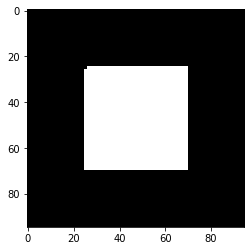

tensor([25, 25, 25,  ..., 69, 69, 69])
tensor([2400, 2401, 2402,  ..., 6622, 6623, 6624])


In [13]:
centroids = get_centroids(embeddings, foreground, background)
# print("centroids:", centroids)
heat_map = embeddings_accuracy(embeddings, flatten_labels, labels.shape, centroids, num_classes=2)
# t = .view(-1)
t = torch.tensor(heat_map)
foreground2 = torch.where(t == 1)[0]
plt.imshow(heat_map, cmap=plt.cm.gray)
plt.show()
print(foreground2)
print(foreground)

In [14]:
torch.save(model.state_dict(), './model6_1.pt')

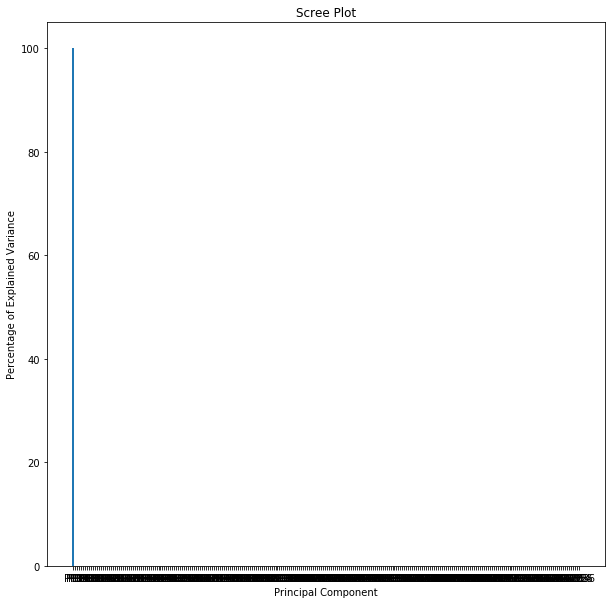

embedding35    -0.062502
embedding116   -0.062502
embedding125   -0.062502
dtype: float64


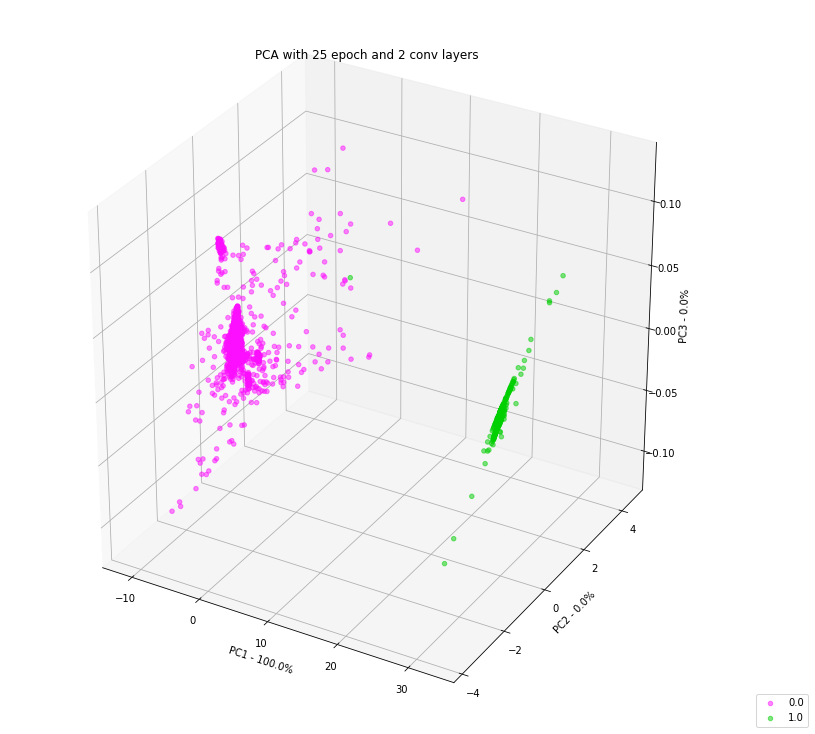

In [15]:
plot_PCA(embeddings, flatten_labels, out_features_size=out_features_size,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=True, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Experiment 1.2

In [18]:
# best accuracy in path = './model3_1.pt'
import torch.optim as optim
last_out_channel = 256
model = EmbeddingNet6(last_out_channel)
# model.apply(init_weights)
lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 20000.
criterion = TripletLoss(margin)
n_epochs = 10

In [19]:
model.load_state_dict(torch.load('./model6_1.pt'))

<All keys matched successfully>

In [20]:
model = train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=95, num_batches=95)

Epochs:  10%|█         | 1/10 [01:33<13:57, 93.07s/it]

loss: 14541.843750


Epochs:  20%|██        | 2/10 [03:04<12:21, 92.66s/it]

loss: 14255.861328


Epochs:  30%|███       | 3/10 [04:27<10:28, 89.82s/it]

loss: 13971.775391


Epochs:  40%|████      | 4/10 [05:51<08:46, 87.82s/it]

loss: 13689.777344


Epochs:  50%|█████     | 5/10 [07:23<07:25, 89.08s/it]

loss: 13407.255859


Epochs:  60%|██████    | 6/10 [08:52<05:57, 89.29s/it]

loss: 13123.902344


Epochs:  70%|███████   | 7/10 [10:23<04:29, 89.73s/it]

loss: 12851.708984


Epochs:  80%|████████  | 8/10 [11:52<02:58, 89.36s/it]

loss: 12564.773438


Epochs:  90%|█████████ | 9/10 [13:22<01:29, 89.69s/it]

loss: 12637.545898


Epochs: 100%|██████████| 10/10 [14:53<00:00, 89.39s/it]

loss: 12029.070312
Best val loss: 12029.070312


In [21]:
out_features_size = last_out_channel
model.eval()

with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    model = model.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

c, w = 0, 0
for i in embeddings:
    if np.array_equal(i, np.array([0.]*out_features_size)):
        c += 1
    else:
        w += 1
#     print(i)    
print("zeros count:", c)
print("not zeros count:", w)

embeddings.shape: (9025, 256)
flatten_labels.shape: torch.Size([9025])
zeros count: 0
not zeros count: 9025


In [22]:
centroids = get_centroids(embeddings, foreground, background)

correct: 9019, wrong: 6, accuracy: 99.93351800554017%


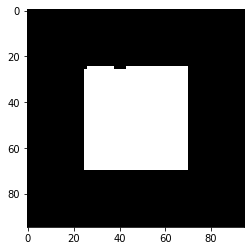

tensor([25, 25, 25,  ..., 69, 69, 69])
tensor([2400, 2401, 2402,  ..., 6622, 6623, 6624])


In [23]:
# print("centroids:", centroids)
heat_map = embeddings_accuracy(embeddings, flatten_labels, labels.shape, centroids, num_classes=2)
# t = .view(-1)
t = torch.tensor(heat_map)
foreground2 = torch.where(t == 1)[0]
plt.imshow(heat_map, cmap=plt.cm.gray)
plt.show()
print(foreground2)
print(foreground)

In [24]:
torch.save(model.state_dict(), './model6_2.pt')

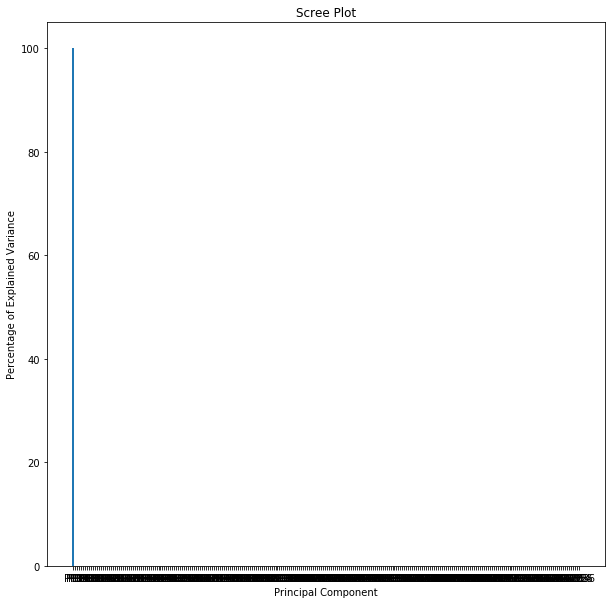

embedding188   -0.062502
embedding84    -0.062502
embedding111   -0.062502
dtype: float64


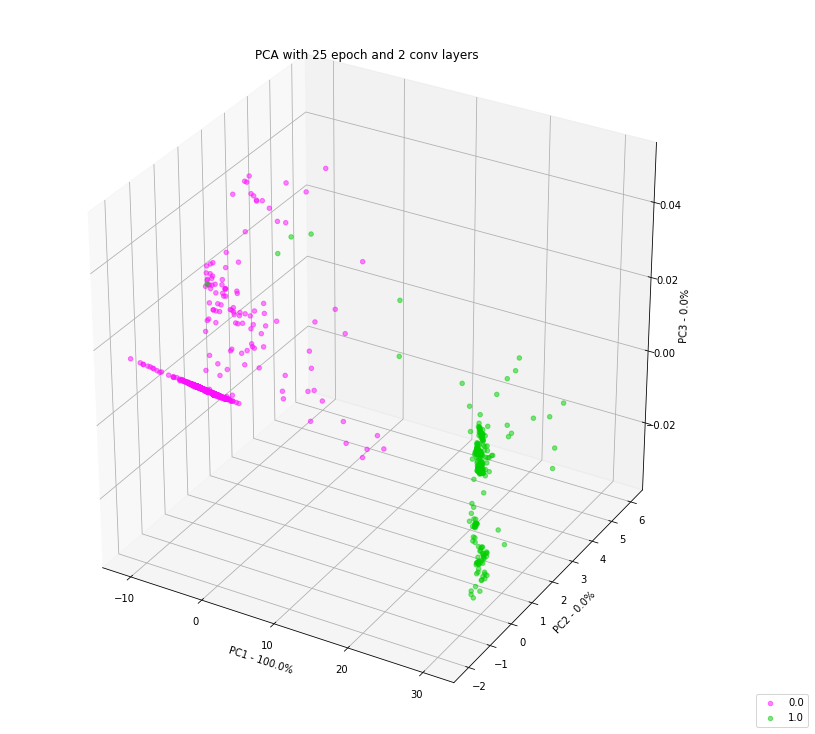

In [25]:
plot_PCA(embeddings, flatten_labels, out_features_size=out_features_size,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=True, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Experiment 1.3

In [27]:
import torch.optim as optim
last_out_channel = 256
model = EmbeddingNet6(last_out_channel)
# model.apply(init_weights)
lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 10000.
criterion = TripletLoss(margin)
n_epochs = 20

In [28]:
model = train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=95, num_batches=95)

Epochs:   5%|▌         | 1/20 [01:22<26:12, 82.77s/it]

loss: 9922.769531


Epochs:  10%|█         | 2/20 [02:46<24:52, 82.92s/it]

loss: 9701.460938


Epochs:  15%|█▌        | 3/20 [04:09<23:31, 83.04s/it]

loss: 9435.208984


Epochs:  20%|██        | 4/20 [05:32<22:09, 83.12s/it]

loss: 9158.408203


Epochs:  25%|██▌       | 5/20 [06:55<20:46, 83.12s/it]

loss: 8861.808594


Epochs:  30%|███       | 6/20 [08:18<19:23, 83.08s/it]

loss: 8567.696289


Epochs:  35%|███▌      | 7/20 [09:42<18:01, 83.18s/it]

loss: 8257.522461


Epochs:  40%|████      | 8/20 [11:17<17:20, 86.74s/it]

loss: 7944.252441


Epochs:  45%|████▌     | 9/20 [12:51<16:19, 89.05s/it]

loss: 7634.935059


Epochs:  50%|█████     | 10/20 [14:26<15:06, 90.69s/it]

loss: 7323.983398


Epochs:  55%|█████▌    | 11/20 [16:01<13:48, 92.02s/it]

loss: 7009.710938


Epochs:  60%|██████    | 12/20 [17:36<12:22, 92.86s/it]

loss: 6700.083008


Epochs:  65%|██████▌   | 13/20 [19:11<10:54, 93.56s/it]

loss: 6386.578125


Epochs:  70%|███████   | 14/20 [20:43<09:18, 93.14s/it]

loss: 6065.756348


Epochs:  75%|███████▌  | 15/20 [22:14<07:42, 92.50s/it]

loss: 5763.264160


Epochs:  80%|████████  | 16/20 [23:45<06:08, 92.12s/it]

loss: 5465.574219


Epochs:  85%|████████▌ | 17/20 [25:16<04:35, 91.83s/it]

loss: 5133.000977


Epochs:  95%|█████████▌| 19/20 [28:19<01:31, 91.50s/it]

loss: 4513.737305


Epochs: 100%|██████████| 20/20 [29:50<00:00, 89.54s/it]

loss: 4208.277832
Best val loss: 4208.277832


In [29]:
out_features_size = last_out_channel
model.eval()

with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    model = model.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

c, w = 0, 0
for i in embeddings:
    if np.array_equal(i, np.array([0.]*out_features_size)):
        c += 1
    else:
        w += 1
#     print(i)    
print("zeros count:", c)
print("not zeros count:", w)

embeddings.shape: (9025, 256)
flatten_labels.shape: torch.Size([9025])
zeros count: 0
not zeros count: 9025


correct: 9006, wrong: 19, accuracy: 99.78947368421052%


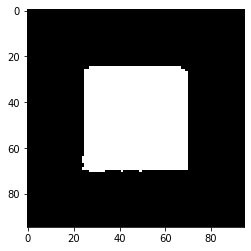

tensor([25, 25, 25,  ..., 70, 70, 70])
tensor([2400, 2401, 2402,  ..., 6622, 6623, 6624])


In [30]:
centroids = get_centroids(embeddings, foreground, background)

# print("centroids:", centroids)
heat_map = embeddings_accuracy(embeddings, flatten_labels, labels.shape, centroids, num_classes=2)
# t = .view(-1)
t = torch.tensor(heat_map)
foreground2 = torch.where(t == 1)[0]
plt.imshow(heat_map, cmap=plt.cm.gray)
plt.show()
print(foreground2)
print(foreground)

In [31]:
torch.save(model.state_dict(), './model6_3.pt')

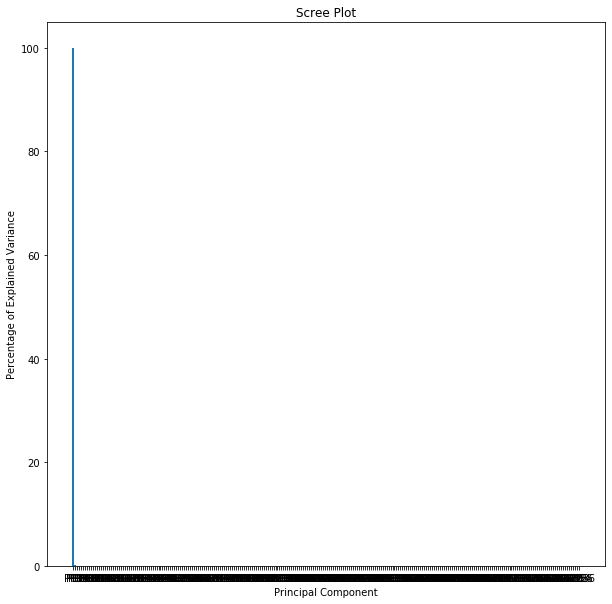

embedding83     0.062511
embedding163    0.062511
embedding215    0.062511
dtype: float64


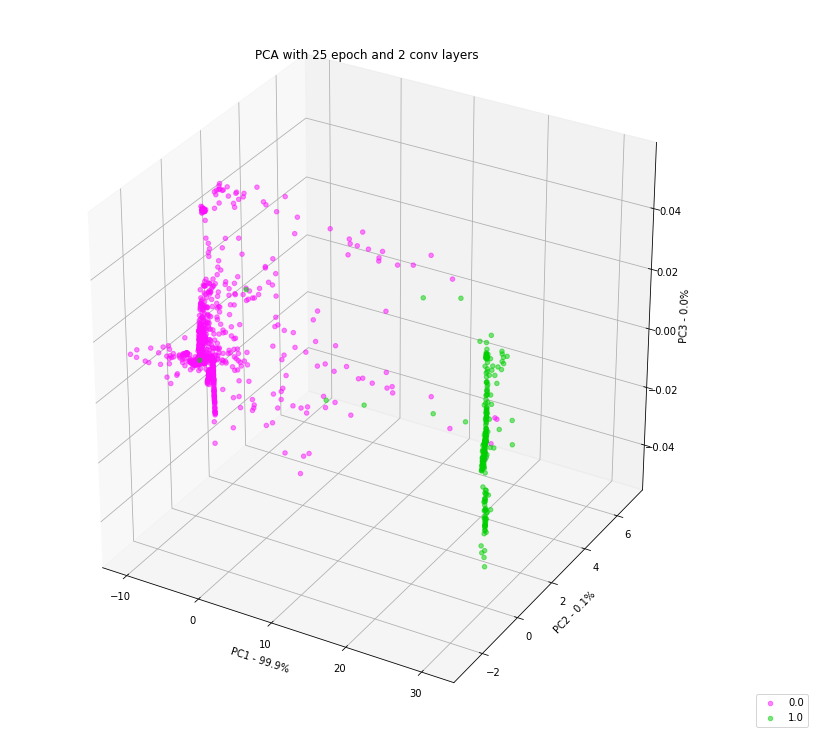

In [33]:
plot_PCA(embeddings, flatten_labels, out_features_size=out_features_size,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=True, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Experiment 2

In [96]:
import torch.optim as optim

model = EmbeddingNet()
model.apply(init_weights)
lr = 1e-1
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 1000
criterion = TripletLoss(margin)
n_epochs = 50

In [97]:
train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=16, num_batches=20)

Training:   8%|▊         | 25/320 [00:00<00:01, 246.56it/s]

Epoch: 1/50 - Loss: 2906.4644



Training:   6%|▌         | 19/320 [00:00<00:01, 188.61it/s]

Epoch: 2/50 - Loss: 1000.0953



Training:   9%|▉         | 28/320 [00:00<00:01, 274.90it/s]

Epoch: 3/50 - Loss: 999.9493



Training:  10%|█         | 32/320 [00:00<00:00, 313.58it/s]

Epoch: 4/50 - Loss: 999.9979



Training:   8%|▊         | 25/320 [00:00<00:01, 243.60it/s]

Epoch: 5/50 - Loss: 999.8887



Training:   9%|▉         | 30/320 [00:00<00:00, 296.56it/s]

Epoch: 6/50 - Loss: 1000.1859



Training:   7%|▋         | 21/320 [00:00<00:01, 209.03it/s]

Epoch: 7/50 - Loss: 999.9320



Training:   8%|▊         | 26/320 [00:00<00:01, 255.09it/s]

Epoch: 8/50 - Loss: 999.6542



Training:  11%|█▏        | 36/320 [00:00<00:00, 359.63it/s]

Epoch: 9/50 - Loss: 999.9254



Training:  11%|█         | 34/320 [00:00<00:00, 337.09it/s]

Epoch: 10/50 - Loss: 999.2012



Training:  12%|█▎        | 40/320 [00:00<00:00, 397.25it/s]

Epoch: 11/50 - Loss: 997.4474



Training:   9%|▉         | 29/320 [00:00<00:01, 289.15it/s]

Epoch: 12/50 - Loss: 1002.0823



Training:  11%|█         | 34/320 [00:00<00:00, 338.26it/s]

Epoch: 13/50 - Loss: 994.6958



Training:   9%|▉         | 30/320 [00:00<00:00, 298.49it/s]

Epoch: 14/50 - Loss: 1002.4528



Training:   9%|▉         | 30/320 [00:00<00:00, 295.93it/s]

Epoch: 15/50 - Loss: 1003.4126



Training:   9%|▉         | 28/320 [00:00<00:01, 277.24it/s]

Epoch: 16/50 - Loss: 1004.4750



Training:  11%|█         | 34/320 [00:00<00:00, 335.06it/s]

Epoch: 17/50 - Loss: 997.9296



Training:   9%|▉         | 30/320 [00:00<00:00, 296.15it/s]

Epoch: 18/50 - Loss: 971.2710



Training:   7%|▋         | 23/320 [00:00<00:01, 226.91it/s]

Epoch: 19/50 - Loss: 995.6027



Training:   9%|▉         | 28/320 [00:00<00:01, 279.29it/s]

Epoch: 20/50 - Loss: 1010.7313



Training:   9%|▉         | 28/320 [00:00<00:01, 269.78it/s]

Epoch: 21/50 - Loss: 946.2002



Training:   9%|▉         | 28/320 [00:00<00:01, 264.57it/s]

Epoch: 22/50 - Loss: 1001.1603



Training:  12%|█▎        | 40/320 [00:00<00:00, 393.06it/s]

Epoch: 23/50 - Loss: 965.7963



Training:  11%|█         | 34/320 [00:00<00:00, 317.60it/s]

Epoch: 24/50 - Loss: 959.1058



Training:  10%|█         | 32/320 [00:00<00:00, 317.51it/s]

Epoch: 25/50 - Loss: 1011.4257



Training:   9%|▉         | 30/320 [00:00<00:00, 296.36it/s]

Epoch: 26/50 - Loss: 1003.7086



Training:  13%|█▎        | 41/320 [00:00<00:00, 406.66it/s]

Epoch: 27/50 - Loss: 978.4559



Training:  11%|█         | 34/320 [00:00<00:00, 337.28it/s]

Epoch: 28/50 - Loss: 988.4094



Training:  10%|▉         | 31/320 [00:00<00:00, 309.03it/s]

Epoch: 29/50 - Loss: 959.9469



Training:   9%|▉         | 29/320 [00:00<00:01, 284.58it/s]

Epoch: 30/50 - Loss: 995.7307



Training:   8%|▊         | 25/320 [00:00<00:01, 243.51it/s]

Epoch: 31/50 - Loss: 1019.1364



Training:   9%|▉         | 29/320 [00:00<00:01, 286.97it/s]

Epoch: 32/50 - Loss: 1008.1121



Training:  11%|█▏        | 36/320 [00:00<00:00, 354.08it/s]

Epoch: 33/50 - Loss: 970.9111



Training:  10%|█         | 33/320 [00:00<00:00, 321.76it/s]

Epoch: 34/50 - Loss: 969.5975



Training:   8%|▊         | 25/320 [00:00<00:01, 249.85it/s]

Epoch: 35/50 - Loss: 946.4118



Training:  11%|█▏        | 36/320 [00:00<00:00, 344.21it/s]

Epoch: 36/50 - Loss: 944.1168



Training:   9%|▉         | 28/320 [00:00<00:01, 279.59it/s]

Epoch: 37/50 - Loss: 980.8253



Training:   9%|▉         | 29/320 [00:00<00:01, 278.44it/s]

Epoch: 38/50 - Loss: 990.0334



Training:  10%|█         | 33/320 [00:00<00:00, 322.76it/s]

Epoch: 39/50 - Loss: 1022.7819



Training:  10%|▉         | 31/320 [00:00<00:00, 306.60it/s]

Epoch: 40/50 - Loss: 987.2342



Training:  10%|█         | 33/320 [00:00<00:00, 326.61it/s]

Epoch: 41/50 - Loss: 962.6898



Training:  11%|█▏        | 36/320 [00:00<00:00, 358.83it/s]

Epoch: 42/50 - Loss: 988.6791



Training:  10%|█         | 32/320 [00:00<00:00, 313.81it/s]

Epoch: 43/50 - Loss: 1009.6515



Training:   9%|▉         | 29/320 [00:00<00:01, 286.00it/s]

Epoch: 44/50 - Loss: 984.5529



Training:   9%|▉         | 30/320 [00:00<00:01, 286.96it/s]

Epoch: 45/50 - Loss: 938.0319



Training:  10%|▉         | 31/320 [00:00<00:00, 294.12it/s]

Epoch: 46/50 - Loss: 983.7125



Training:   9%|▉         | 30/320 [00:00<00:01, 288.06it/s]

Epoch: 47/50 - Loss: 1026.2678



Training:  10%|▉         | 31/320 [00:00<00:00, 304.55it/s]

Epoch: 48/50 - Loss: 942.2355



Training:   9%|▉         | 30/320 [00:00<00:00, 299.76it/s]

Epoch: 49/50 - Loss: 952.8991



Epochs: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]

Epoch: 50/50 - Loss: 1000.1039


In [284]:
out_features_size = 8
model.eval()
with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

embeddings.shape: (9025, 8)
flatten_labels.shape: torch.Size([95, 95])


/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


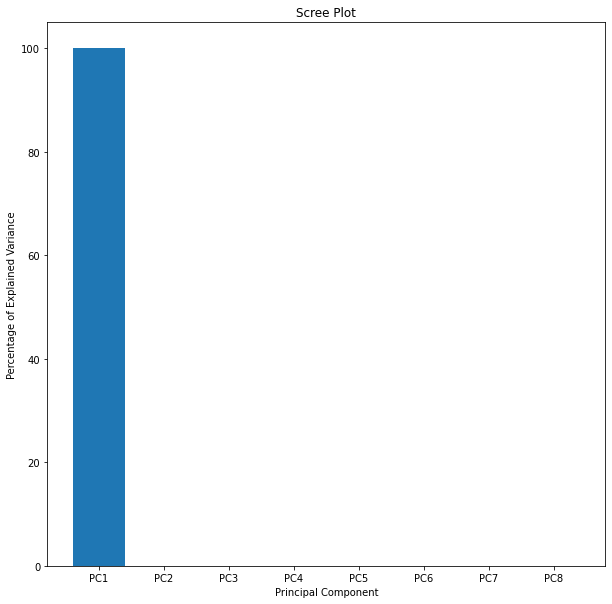

embedding2    0.353593
embedding5    0.353593
embedding4    0.353593
dtype: float32


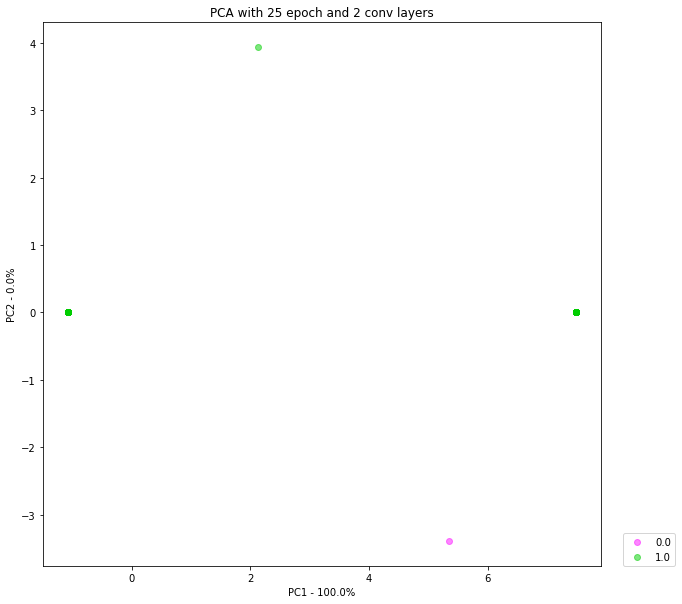

In [99]:
plot_PCA(embeddings, flatten_labels, out_features_size=8,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=False, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Experiment 3

In [100]:
import torch.optim as optim

model = EmbeddingNet()
lr = 1e-1
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 100
criterion = TripletLoss(margin)
n_epochs = 100

In [101]:
train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=16, num_batches=20)

Training:  11%|█         | 35/320 [00:00<00:00, 347.95it/s]

Epoch: 1/100 - Loss: 9713.1855



Training:  10%|█         | 33/320 [00:00<00:00, 326.56it/s]

Epoch: 2/100 - Loss: 99.8609



Training:  10%|▉         | 31/320 [00:00<00:00, 305.87it/s]

Epoch: 3/100 - Loss: 99.7969



Training:   9%|▉         | 30/320 [00:00<00:00, 299.08it/s]

Epoch: 4/100 - Loss: 100.1225



Training:   9%|▉         | 30/320 [00:00<00:00, 296.95it/s]

Epoch: 5/100 - Loss: 99.8072



Training:  10%|█         | 32/320 [00:00<00:00, 316.59it/s]

Epoch: 6/100 - Loss: 100.0156



Training:   9%|▉         | 28/320 [00:00<00:01, 275.43it/s]

Epoch: 7/100 - Loss: 99.9545



Training:  11%|█▏        | 36/320 [00:00<00:00, 353.23it/s]

Epoch: 8/100 - Loss: 99.7383



Training:  12%|█▏        | 38/320 [00:00<00:00, 376.25it/s]

Epoch: 9/100 - Loss: 99.8047



Training:  11%|█         | 34/320 [00:00<00:00, 334.81it/s]

Epoch: 10/100 - Loss: 99.8983



Training:   8%|▊         | 25/320 [00:00<00:01, 247.88it/s]

Epoch: 11/100 - Loss: 99.4691



Training:  12%|█▏        | 37/320 [00:00<00:00, 364.53it/s]

Epoch: 12/100 - Loss: 97.6357



Training:   9%|▉         | 30/320 [00:00<00:00, 297.84it/s]

Epoch: 13/100 - Loss: 95.0221



Training:  11%|█         | 34/320 [00:00<00:00, 332.38it/s]

Epoch: 14/100 - Loss: 97.1253



Training:   9%|▉         | 29/320 [00:00<00:01, 285.34it/s]

Epoch: 15/100 - Loss: 99.9624



Training:  14%|█▍        | 44/320 [00:00<00:00, 438.43it/s]

Epoch: 16/100 - Loss: 96.9936



Training:  13%|█▎        | 41/320 [00:00<00:00, 401.61it/s]

Epoch: 17/100 - Loss: 98.4523



Training:  12%|█▏        | 38/320 [00:00<00:00, 379.65it/s]

Epoch: 18/100 - Loss: 101.2780



Training:  12%|█▎        | 40/320 [00:00<00:00, 393.90it/s]

Epoch: 19/100 - Loss: 99.1209



Training:  13%|█▎        | 43/320 [00:00<00:00, 426.79it/s]

Epoch: 20/100 - Loss: 97.2620



Training:  13%|█▎        | 43/320 [00:00<00:00, 427.33it/s]

Epoch: 21/100 - Loss: 98.5218



Training:  11%|█         | 34/320 [00:00<00:00, 336.57it/s]

Epoch: 22/100 - Loss: 97.3627



Training:  12%|█▏        | 37/320 [00:00<00:00, 361.47it/s]

Epoch: 23/100 - Loss: 89.4872



Training:   9%|▉         | 30/320 [00:00<00:00, 295.39it/s]

Epoch: 24/100 - Loss: 98.5226



Training:  14%|█▍        | 45/320 [00:00<00:00, 447.18it/s]

Epoch: 25/100 - Loss: 100.1589



Training:  13%|█▎        | 41/320 [00:00<00:00, 405.26it/s]

Epoch: 26/100 - Loss: 97.7225



Training:  12%|█▏        | 37/320 [00:00<00:00, 369.67it/s]

Epoch: 27/100 - Loss: 94.5354



Training:   9%|▉         | 30/320 [00:00<00:00, 298.54it/s]

Epoch: 28/100 - Loss: 99.9827



Training:  13%|█▎        | 42/320 [00:00<00:00, 414.43it/s]

Epoch: 29/100 - Loss: 100.1413



Training:  14%|█▍        | 45/320 [00:00<00:00, 443.25it/s]

Epoch: 30/100 - Loss: 96.2685



Training:  12%|█▎        | 40/320 [00:00<00:00, 392.71it/s]

Epoch: 31/100 - Loss: 101.9245



Training:  13%|█▎        | 42/320 [00:00<00:00, 418.45it/s]

Epoch: 32/100 - Loss: 99.8765



Training:  14%|█▍        | 45/320 [00:00<00:00, 447.64it/s]

Epoch: 33/100 - Loss: 100.3192



Training:  13%|█▎        | 42/320 [00:00<00:00, 416.67it/s]

Epoch: 34/100 - Loss: 98.9338



Training:  11%|█▏        | 36/320 [00:00<00:00, 357.16it/s]

Epoch: 35/100 - Loss: 100.4708



Training:  12%|█▏        | 38/320 [00:00<00:00, 376.92it/s]

Epoch: 36/100 - Loss: 100.6273



Training:  12%|█▏        | 37/320 [00:00<00:00, 362.33it/s]

Epoch: 37/100 - Loss: 100.1580



Training:  10%|█         | 33/320 [00:00<00:00, 323.22it/s]

Epoch: 38/100 - Loss: 99.2925



Training:  11%|█▏        | 36/320 [00:00<00:00, 357.65it/s]

Epoch: 39/100 - Loss: 100.6021



Training:  11%|█▏        | 36/320 [00:00<00:00, 347.51it/s]

Epoch: 40/100 - Loss: 98.6136



Training:  13%|█▎        | 41/320 [00:00<00:00, 404.73it/s]

Epoch: 41/100 - Loss: 95.0381



Training:  12%|█▎        | 40/320 [00:00<00:00, 392.60it/s]

Epoch: 42/100 - Loss: 100.6219



Training:  14%|█▍        | 45/320 [00:00<00:00, 446.12it/s]

Epoch: 43/100 - Loss: 99.8976



Training:  14%|█▍        | 45/320 [00:00<00:00, 442.07it/s]

Epoch: 44/100 - Loss: 94.7878



Training:  13%|█▎        | 42/320 [00:00<00:00, 416.20it/s]

Epoch: 45/100 - Loss: 97.9120



Training:   9%|▉         | 30/320 [00:00<00:00, 299.41it/s]

Epoch: 46/100 - Loss: 100.8363



Training:  14%|█▍        | 44/320 [00:00<00:00, 435.40it/s]

Epoch: 47/100 - Loss: 100.9006



Training:  13%|█▎        | 43/320 [00:00<00:00, 426.78it/s]

Epoch: 48/100 - Loss: 100.0930



Training:  14%|█▍        | 44/320 [00:00<00:00, 436.72it/s]

Epoch: 49/100 - Loss: 100.0165



Training:  10%|█         | 32/320 [00:00<00:00, 315.41it/s]

Epoch: 50/100 - Loss: 99.9979



Training:  13%|█▎        | 43/320 [00:00<00:00, 425.83it/s]

Epoch: 51/100 - Loss: 100.0068



Training:  12%|█▏        | 38/320 [00:00<00:00, 375.79it/s]

Epoch: 52/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 398.95it/s]

Epoch: 53/100 - Loss: 100.0001



Training:  13%|█▎        | 41/320 [00:00<00:00, 406.78it/s]

Epoch: 54/100 - Loss: 100.0000



Training:  11%|█         | 34/320 [00:00<00:00, 338.02it/s]

Epoch: 55/100 - Loss: 100.0000



Training:  13%|█▎        | 42/320 [00:00<00:00, 414.06it/s]

Epoch: 56/100 - Loss: 100.0000



Training:  14%|█▍        | 44/320 [00:00<00:00, 438.25it/s]

Epoch: 57/100 - Loss: 100.0000



Training:  10%|█         | 33/320 [00:00<00:00, 327.76it/s]

Epoch: 58/100 - Loss: 100.0000



Training:  12%|█▏        | 37/320 [00:00<00:00, 369.88it/s]

Epoch: 59/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 397.70it/s]

Epoch: 60/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 395.68it/s]

Epoch: 61/100 - Loss: 100.0000



Training:  11%|█         | 35/320 [00:00<00:00, 333.42it/s]

Epoch: 62/100 - Loss: 100.0000



Training:  10%|█         | 33/320 [00:00<00:00, 317.28it/s]

Epoch: 63/100 - Loss: 100.0000



Training:  12%|█▏        | 39/320 [00:00<00:00, 389.64it/s]

Epoch: 64/100 - Loss: 100.0000



Training:  12%|█▏        | 38/320 [00:00<00:00, 379.48it/s]

Epoch: 65/100 - Loss: 100.0000



Training:  14%|█▍        | 44/320 [00:00<00:00, 439.95it/s]

Epoch: 66/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 399.32it/s]

Epoch: 67/100 - Loss: 100.0000



Training:  10%|▉         | 31/320 [00:00<00:00, 308.19it/s]

Epoch: 68/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 359.20it/s]

Epoch: 69/100 - Loss: 100.0000



Training:  12%|█▏        | 37/320 [00:00<00:00, 366.47it/s]

Epoch: 70/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 355.83it/s]

Epoch: 71/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 395.61it/s]

Epoch: 72/100 - Loss: 100.0000



Training:  12%|█▏        | 39/320 [00:00<00:00, 381.90it/s]

Epoch: 73/100 - Loss: 100.0000



Training:  12%|█▏        | 39/320 [00:00<00:00, 382.13it/s]

Epoch: 74/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 337.17it/s]

Epoch: 75/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 344.21it/s]

Epoch: 76/100 - Loss: 100.0000



Training:   8%|▊         | 26/320 [00:00<00:01, 257.37it/s]

Epoch: 77/100 - Loss: 100.0000



Training:   9%|▉         | 28/320 [00:00<00:01, 269.43it/s]

Epoch: 78/100 - Loss: 100.0000



Training:  10%|▉         | 31/320 [00:00<00:00, 290.61it/s]

Epoch: 79/100 - Loss: 100.0000



Training:   9%|▉         | 29/320 [00:00<00:01, 286.74it/s]

Epoch: 80/100 - Loss: 100.0000



Training:   9%|▉         | 30/320 [00:00<00:00, 292.67it/s]

Epoch: 81/100 - Loss: 100.0000



Training:   9%|▉         | 30/320 [00:00<00:00, 296.92it/s]

Epoch: 82/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 359.22it/s]

Epoch: 83/100 - Loss: 100.0000



Training:  12%|█▎        | 40/320 [00:00<00:00, 399.65it/s]

Epoch: 84/100 - Loss: 100.0000



Training:  12%|█▏        | 38/320 [00:00<00:00, 373.14it/s]

Epoch: 85/100 - Loss: 100.0000



Training:  12%|█▏        | 37/320 [00:00<00:00, 354.90it/s]

Epoch: 86/100 - Loss: 100.0000



Training:  14%|█▍        | 44/320 [00:00<00:00, 438.61it/s]

Epoch: 87/100 - Loss: 100.0000



Training:  10%|█         | 33/320 [00:00<00:00, 327.90it/s]

Epoch: 88/100 - Loss: 100.0000



Training:  10%|█         | 32/320 [00:00<00:00, 316.05it/s]

Epoch: 89/100 - Loss: 100.0000



Training:  11%|█▏        | 36/320 [00:00<00:00, 353.07it/s]

Epoch: 90/100 - Loss: 100.0000



Training:   9%|▉         | 30/320 [00:00<00:00, 299.44it/s]

Epoch: 91/100 - Loss: 100.0000



Training:  14%|█▍        | 44/320 [00:00<00:00, 439.09it/s]

Epoch: 92/100 - Loss: 100.0000



Training:  13%|█▎        | 43/320 [00:00<00:00, 424.04it/s]

Epoch: 93/100 - Loss: 100.0000



Training:  12%|█▏        | 39/320 [00:00<00:00, 383.63it/s]

Epoch: 94/100 - Loss: 100.0000



Training:  14%|█▍        | 44/320 [00:00<00:00, 438.73it/s]

Epoch: 95/100 - Loss: 100.0000



Training:  14%|█▍        | 45/320 [00:00<00:00, 443.11it/s]

Epoch: 96/100 - Loss: 100.0000



Training:  13%|█▎        | 42/320 [00:00<00:00, 412.37it/s]

Epoch: 97/100 - Loss: 100.0000



Training:  13%|█▎        | 41/320 [00:00<00:00, 403.97it/s]

Epoch: 98/100 - Loss: 100.0000



Training:  12%|█▏        | 39/320 [00:00<00:00, 389.28it/s]

Epoch: 99/100 - Loss: 100.0000



Epochs: 100%|██████████| 100/100 [01:27<00:00,  1.15it/s]

Epoch: 100/100 - Loss: 100.0000


In [102]:
out_features_size = 8
model.eval()
with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

embeddings.shape: (9025, 8)
flatten_labels.shape: torch.Size([9025])


/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/decomposition/_pca.py:463: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var


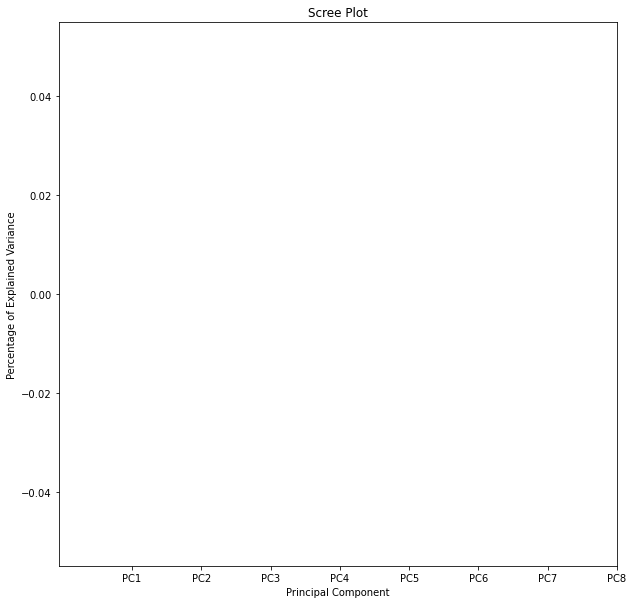

embedding1    1.0
embedding8    0.0
embedding7    0.0
dtype: float32


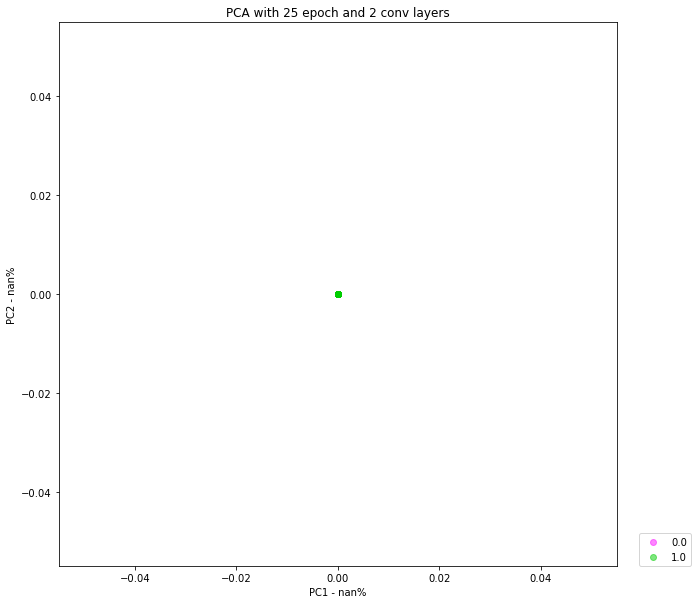

In [103]:
plot_PCA(embeddings, flatten_labels, out_features_size=8,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=False, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Experiment 4

In [104]:
import torch.optim as optim

model = EmbeddingNet()
lr = 1e-1
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 100
criterion = TripletLoss(margin)
n_epochs = 100

In [105]:
train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=16, num_batches=200)

Training:   1%|▏         | 43/3200 [00:00<00:07, 426.40it/s]

Epoch: 1/100 - Loss: 449.9220



Training:   1%|▏         | 46/3200 [00:00<00:06, 457.75it/s]

Epoch: 2/100 - Loss: 726.2817



Training:   1%|▏         | 46/3200 [00:00<00:06, 453.28it/s]

Epoch: 3/100 - Loss: 97.8363



Training:   1%|▏         | 47/3200 [00:00<00:06, 464.05it/s]

Epoch: 4/100 - Loss: 99.0294



Training:   1%|▏         | 42/3200 [00:00<00:07, 414.70it/s]

Epoch: 5/100 - Loss: 98.9694



Training:   1%|▏         | 44/3200 [00:00<00:07, 438.86it/s]

Epoch: 6/100 - Loss: 98.4068



Training:   1%|▏         | 46/3200 [00:00<00:06, 451.22it/s]

Epoch: 7/100 - Loss: 98.4555



Training:   1%|▏         | 40/3200 [00:00<00:07, 396.29it/s]

Epoch: 8/100 - Loss: 98.9009



Training:   1%|          | 37/3200 [00:00<00:08, 363.95it/s]

Epoch: 9/100 - Loss: 99.1011



Training:   1%|          | 32/3200 [00:00<00:10, 313.53it/s]

Epoch: 10/100 - Loss: 97.8354



Training:   1%|▏         | 44/3200 [00:00<00:07, 435.19it/s]

Epoch: 11/100 - Loss: 99.0788



Training:   1%|          | 34/3200 [00:00<00:09, 334.08it/s]

Epoch: 12/100 - Loss: 98.9033



Training:   1%|          | 39/3200 [00:00<00:08, 385.00it/s]

Epoch: 13/100 - Loss: 97.9339



Training:   1%|▏         | 40/3200 [00:00<00:07, 395.45it/s]

Epoch: 14/100 - Loss: 96.6690



Training:   1%|          | 37/3200 [00:00<00:08, 369.56it/s]

Epoch: 15/100 - Loss: 99.5663



Training:   1%|          | 38/3200 [00:00<00:08, 374.33it/s]

Epoch: 16/100 - Loss: 98.8305



Training:   1%|          | 37/3200 [00:00<00:08, 367.71it/s]

Epoch: 17/100 - Loss: 98.3807



Training:   1%|          | 32/3200 [00:00<00:10, 316.28it/s]

Epoch: 18/100 - Loss: 98.7199



Training:   1%|          | 34/3200 [00:00<00:09, 339.09it/s]

Epoch: 19/100 - Loss: 98.8857



Training:   1%|          | 30/3200 [00:00<00:10, 299.15it/s]

Epoch: 20/100 - Loss: 99.1187



Training:   1%|▏         | 44/3200 [00:00<00:07, 436.51it/s]

Epoch: 21/100 - Loss: 98.3709



Training:   1%|▏         | 42/3200 [00:00<00:07, 413.93it/s]

Epoch: 22/100 - Loss: 98.6207



Training:   1%|▏         | 42/3200 [00:00<00:07, 417.12it/s]

Epoch: 23/100 - Loss: 99.5734



Training:   1%|▏         | 43/3200 [00:00<00:07, 423.37it/s]

Epoch: 24/100 - Loss: 99.3153



Training:   1%|▏         | 45/3200 [00:00<00:07, 446.73it/s]

Epoch: 25/100 - Loss: 98.8975



Training:   1%|▏         | 42/3200 [00:00<00:07, 419.69it/s]

Epoch: 26/100 - Loss: 97.5655



Training:   1%|▏         | 44/3200 [00:00<00:07, 432.13it/s]

Epoch: 27/100 - Loss: 97.1735



Training:   1%|▏         | 40/3200 [00:00<00:07, 395.48it/s]

Epoch: 28/100 - Loss: 98.5670



Training:   1%|▏         | 46/3200 [00:00<00:06, 455.41it/s]

Epoch: 29/100 - Loss: 98.5835



Training:   1%|▏         | 42/3200 [00:00<00:07, 411.93it/s]

Epoch: 30/100 - Loss: 97.5990



Training:   1%|          | 27/3200 [00:00<00:12, 260.70it/s]

Epoch: 31/100 - Loss: 97.0283



Training:   1%|▏         | 45/3200 [00:00<00:07, 449.96it/s]

Epoch: 32/100 - Loss: 97.3254



Training:   1%|          | 33/3200 [00:00<00:09, 321.12it/s]

Epoch: 33/100 - Loss: 99.2526



Training:   1%|▏         | 41/3200 [00:00<00:07, 409.96it/s]

Epoch: 34/100 - Loss: 98.2437



Training:   1%|          | 37/3200 [00:00<00:08, 369.06it/s]

Epoch: 35/100 - Loss: 97.5102



Training:   1%|          | 39/3200 [00:00<00:08, 385.12it/s]

Epoch: 36/100 - Loss: 98.7266



Training:   1%|▏         | 44/3200 [00:00<00:07, 436.56it/s]

Epoch: 37/100 - Loss: 98.3816



Training:   1%|▏         | 45/3200 [00:00<00:07, 449.94it/s]

Epoch: 38/100 - Loss: 98.1369



Training:   1%|          | 39/3200 [00:00<00:08, 387.37it/s]

Epoch: 39/100 - Loss: 98.0539



Training:   1%|▏         | 45/3200 [00:00<00:07, 444.37it/s]

Epoch: 40/100 - Loss: 99.1037



Training:   1%|▏         | 42/3200 [00:00<00:07, 413.16it/s]

Epoch: 41/100 - Loss: 98.9903



Training:   1%|▏         | 43/3200 [00:00<00:07, 428.02it/s]

Epoch: 42/100 - Loss: 99.3382



Training:   1%|▏         | 41/3200 [00:00<00:07, 402.55it/s]

Epoch: 43/100 - Loss: 99.7938



Training:   1%|▏         | 45/3200 [00:00<00:07, 448.86it/s]

Epoch: 44/100 - Loss: 98.6723



Training:   1%|▏         | 45/3200 [00:00<00:07, 447.20it/s]

Epoch: 45/100 - Loss: 99.5232



Training:   1%|▏         | 44/3200 [00:00<00:07, 434.57it/s]

Epoch: 46/100 - Loss: 98.4286



Training:   1%|▏         | 42/3200 [00:00<00:07, 416.24it/s]

Epoch: 47/100 - Loss: 98.4676



Training:   1%|          | 29/3200 [00:00<00:10, 288.92it/s]

Epoch: 48/100 - Loss: 98.7119



Training:   2%|▏         | 48/3200 [00:00<00:06, 473.10it/s]

Epoch: 49/100 - Loss: 98.4824



Training:   1%|          | 36/3200 [00:00<00:08, 359.70it/s]

Epoch: 50/100 - Loss: 97.6092



Training:   2%|▏         | 50/3200 [00:00<00:06, 491.24it/s]

Epoch: 51/100 - Loss: 99.5559



Training:   2%|▏         | 49/3200 [00:00<00:06, 480.85it/s]

Epoch: 52/100 - Loss: 98.5315



Training:   2%|▏         | 50/3200 [00:00<00:06, 492.19it/s]

Epoch: 53/100 - Loss: 98.3959



Training:   2%|▏         | 50/3200 [00:00<00:06, 492.74it/s]

Epoch: 54/100 - Loss: 98.8792



Training:   2%|▏         | 50/3200 [00:00<00:06, 497.12it/s]

Epoch: 55/100 - Loss: 98.3739



Training:   2%|▏         | 49/3200 [00:00<00:06, 483.53it/s]

Epoch: 56/100 - Loss: 98.4329



Training:   2%|▏         | 49/3200 [00:00<00:06, 487.25it/s]

Epoch: 57/100 - Loss: 99.2725



Training:   1%|▏         | 43/3200 [00:00<00:07, 421.94it/s]

Epoch: 58/100 - Loss: 98.6714



Training:   1%|▏         | 42/3200 [00:00<00:07, 413.87it/s]

Epoch: 59/100 - Loss: 97.9115



Training:   1%|          | 39/3200 [00:00<00:08, 386.74it/s]

Epoch: 60/100 - Loss: 99.6270



Training:   1%|          | 39/3200 [00:00<00:08, 368.35it/s]

Epoch: 61/100 - Loss: 97.8979



Training:   1%|▏         | 46/3200 [00:00<00:06, 454.36it/s]

Epoch: 62/100 - Loss: 98.8749



Training:   1%|▏         | 45/3200 [00:00<00:07, 445.37it/s]

Epoch: 63/100 - Loss: 99.6100



Training:   2%|▏         | 49/3200 [00:00<00:06, 488.09it/s]

Epoch: 64/100 - Loss: 98.8146



Training:   1%|▏         | 45/3200 [00:00<00:07, 448.59it/s]

Epoch: 65/100 - Loss: 98.3363



Training:   1%|          | 23/3200 [00:00<00:13, 228.57it/s]

Epoch: 66/100 - Loss: 97.0946



Training:   2%|▏         | 49/3200 [00:00<00:06, 488.68it/s]

Epoch: 67/100 - Loss: 96.5723



Training:   2%|▏         | 50/3200 [00:00<00:06, 490.48it/s]

Epoch: 68/100 - Loss: 98.8682



Training:   2%|▏         | 50/3200 [00:00<00:06, 494.74it/s]

Epoch: 69/100 - Loss: 98.8767



Training:   2%|▏         | 50/3200 [00:00<00:06, 494.72it/s]

Epoch: 70/100 - Loss: 98.7147



Training:   2%|▏         | 49/3200 [00:00<00:06, 482.46it/s]

Epoch: 71/100 - Loss: 98.1268



Training:   2%|▏         | 49/3200 [00:00<00:06, 487.72it/s]

Epoch: 72/100 - Loss: 98.5305



Training:   1%|          | 35/3200 [00:00<00:09, 346.41it/s]

Epoch: 73/100 - Loss: 97.4953



Training:   1%|▏         | 40/3200 [00:00<00:08, 379.38it/s]

Epoch: 74/100 - Loss: 97.7506



Training:   1%|          | 35/3200 [00:00<00:09, 341.70it/s]

Epoch: 75/100 - Loss: 98.4241



Training:   1%|▏         | 47/3200 [00:00<00:06, 464.71it/s]

Epoch: 76/100 - Loss: 98.9976



Training:   2%|▏         | 49/3200 [00:00<00:06, 485.65it/s]

Epoch: 77/100 - Loss: 98.7706



Training:   1%|▏         | 40/3200 [00:00<00:08, 394.12it/s]

Epoch: 78/100 - Loss: 97.6863



Training:   1%|▏         | 44/3200 [00:00<00:07, 436.22it/s]

Epoch: 79/100 - Loss: 98.0717



Training:   1%|          | 25/3200 [00:00<00:13, 242.43it/s]

Epoch: 80/100 - Loss: 98.7001



Training:   1%|          | 31/3200 [00:00<00:10, 308.81it/s]

Epoch: 81/100 - Loss: 98.5118



Training:   1%|          | 29/3200 [00:00<00:11, 287.95it/s]

Epoch: 82/100 - Loss: 97.6815



Training:   1%|▏         | 41/3200 [00:00<00:07, 402.54it/s]

Epoch: 83/100 - Loss: 98.3030



Training:   1%|          | 27/3200 [00:00<00:11, 268.94it/s]

Epoch: 84/100 - Loss: 98.7352



Training:   1%|          | 18/3200 [00:00<00:18, 172.92it/s]

Epoch: 85/100 - Loss: 98.0029



Training:   1%|▏         | 43/3200 [00:00<00:07, 397.68it/s]

Epoch: 86/100 - Loss: 99.3648



Training:   1%|          | 30/3200 [00:00<00:10, 294.80it/s]

Epoch: 87/100 - Loss: 98.6257



Training:   1%|          | 39/3200 [00:00<00:08, 385.13it/s]

Epoch: 88/100 - Loss: 98.8002



Training:   1%|          | 31/3200 [00:00<00:10, 307.66it/s]

Epoch: 89/100 - Loss: 98.5874



Training:   1%|▏         | 45/3200 [00:00<00:07, 440.89it/s]

Epoch: 90/100 - Loss: 98.5551



Training:   1%|▏         | 43/3200 [00:00<00:07, 425.05it/s]

Epoch: 91/100 - Loss: 98.8822



Training:   1%|▏         | 45/3200 [00:00<00:07, 444.52it/s]

Epoch: 92/100 - Loss: 98.9164



Training:   1%|▏         | 41/3200 [00:00<00:07, 405.47it/s]

Epoch: 93/100 - Loss: 99.1376



Training:   1%|▏         | 41/3200 [00:00<00:07, 408.95it/s]

Epoch: 94/100 - Loss: 99.2498



Training:   1%|▏         | 41/3200 [00:00<00:07, 400.66it/s]

Epoch: 95/100 - Loss: 98.3568



Training:   1%|▏         | 41/3200 [00:00<00:07, 395.43it/s]

Epoch: 96/100 - Loss: 98.7259



Training:   1%|          | 34/3200 [00:00<00:09, 333.43it/s]

Epoch: 97/100 - Loss: 98.1714



Training:   1%|          | 39/3200 [00:00<00:08, 387.50it/s]

Epoch: 98/100 - Loss: 97.9513



Training:   1%|▏         | 41/3200 [00:00<00:07, 401.20it/s]

Epoch: 99/100 - Loss: 98.5743



Epochs: 100%|██████████| 100/100 [13:26<00:00,  8.06s/it]

Epoch: 100/100 - Loss: 96.7751


In [106]:
out_features_size = 8
model.eval()
with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

embeddings.shape: (9025, 8)
flatten_labels.shape: torch.Size([9025])


/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


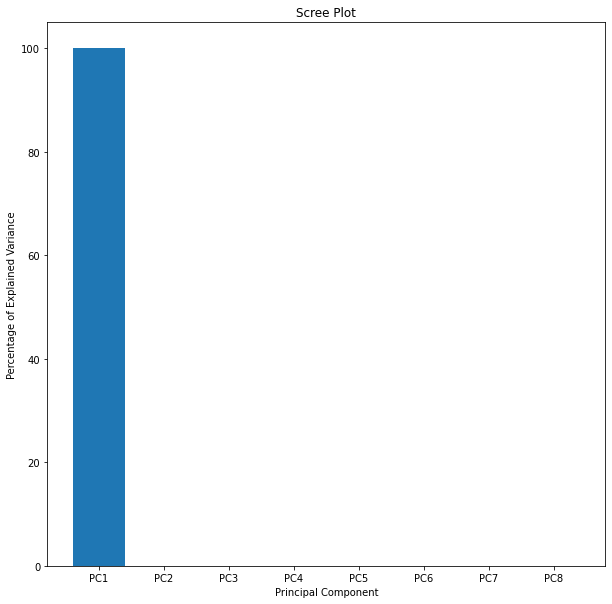

embedding7    0.35357
embedding6    0.35357
embedding5    0.35357
dtype: float32


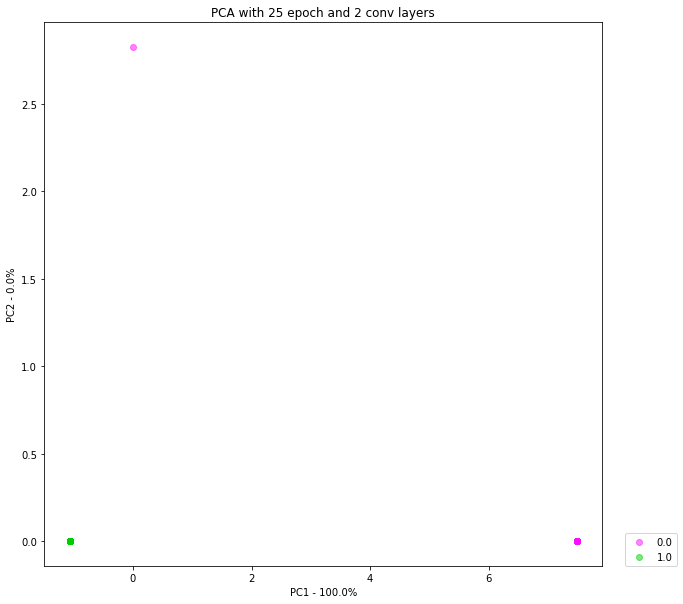

In [107]:
plot_PCA(embeddings, flatten_labels, out_features_size=8,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=False, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

### Change train_model function to back propagate on average loss of triplet losses of batch size

In [60]:
import time

def train_model_avgloss(model, criterion, image, labels, optimizer, foreground, background, num_epochs=25, batch_size=16, num_batches=1):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    model.to(device)
    image = image.to(device)
    # start time
    since = time.time()
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        model.train()  # Set model to training mode
        # zero the parameter gradients
        optimizer.zero_grad()

        with torch.set_grad_enabled(True):
            outputs = model(image) # forward
            for _ in range(num_batches):
                anchors, positives, negatives = get_pixels_triplets(outputs, labels, batch_size, foreground, background)
                
                # targets_triplets = targets_triplets.to(device)
                # loss = criterion(pixels_triplets, targets_triplets)
                loss = 0
                triplet_loss = None
                for idx in range(batch_size):
                    anchors[idx] = anchors[idx].to(device)
                    positives[idx] = positives[idx].to(device)
                    negatives[idx] = negatives[idx].to(device)
                    triplet_loss = criterion(anchors[idx], positives[idx], negatives[idx])
                    print("triplet_loss:", triplet_loss)
                    print("triplet_loss.item():", triplet_loss.item())
                    loss += triplet_loss.item()
                loss /= batch_size
                triplet_loss.item = loss
#                 torch.tensor(loss, device=device, grad_fn=<MeanBackward0>)
                triplet_loss.backward(retain_graph=True)
                optimizer.step()
                outputs = model(image) # forward
    time_elapsed = time.time() - since # time passed
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

## Experiment 5

In [61]:
import torch.optim as optim

model = EmbeddingNet()
lr = 1e-1
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 100
criterion = TripletLoss(margin)
n_epochs = 100

In [62]:
train_model_avgloss(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=16, num_batches=50)

Epoch 0/99
----------
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(51262.3516, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 51262.3515625
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(36449.8906, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 36449.890625
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
tri

triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(3.7668e+08, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 376680128.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(4795.0688, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 4795.06884765625
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(0., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 0.0
triplet_loss: tensor(100., devic

triplet_loss: tensor(100.1480, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.14795684814453
triplet_loss: tensor(99.9987, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 99.9986801147461
triplet_loss: tensor(99.8228, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 99.82275390625
triplet_loss: tensor(99.8534, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 99.85336303710938
triplet_loss: tensor(100.0013, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0013198852539
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100.1759, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.1759262084961
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(99.9987, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 99.9986801147461
triplet_loss: tensor(100., devic

triplet_loss.item(): 100.0
triplet_loss: tensor(100.2440, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.24404907226562
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(95.6629, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 95.66293334960938
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(95.9105, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 95.9105224609375
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(95.9105, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 95.9105224609375
triplet_loss: tensor(100., device='cuda:0', grad_

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(124.4464, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 124.44635772705078
triplet_loss: tensor(124.4464, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 124.44635772705078
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triple

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(130.8096, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 130.80958557128906
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(127.9213, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 127.92125701904297
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(127.9213, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 127.9212

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(105.3374, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 105.33740234375
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(105.3374, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 105.33740234375
triplet_loss: tensor(105.3374, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 105.33740234375
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(105.3374, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 105.33740234375
triplet_loss: tensor(105.3374, device='cuda:0', grad_fn=<MeanBackward0>)
triplet

triplet_loss: tensor(100.0499, device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.04989624023438
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(10

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
Epoch 15/99
----------
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: ten

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
Epoch 16/99
----------
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: ten

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
Epoch 59/99
----------
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: ten

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
Epoch 66/99
-

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
Epoch 69/99
----------
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: ten

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss:

triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:0', grad_fn=<MeanBackward0>)
triplet_loss.item(): 100.0
triplet_loss: tensor(100., device='cuda:

embeddings.shape: (9025, 8)
flatten_labels.shape: torch.Size([9025])


/home/abdulrahman/anaconda3/envs/deeplearning/lib/python3.7/site-packages/sklearn/decomposition/_pca.py:463: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var


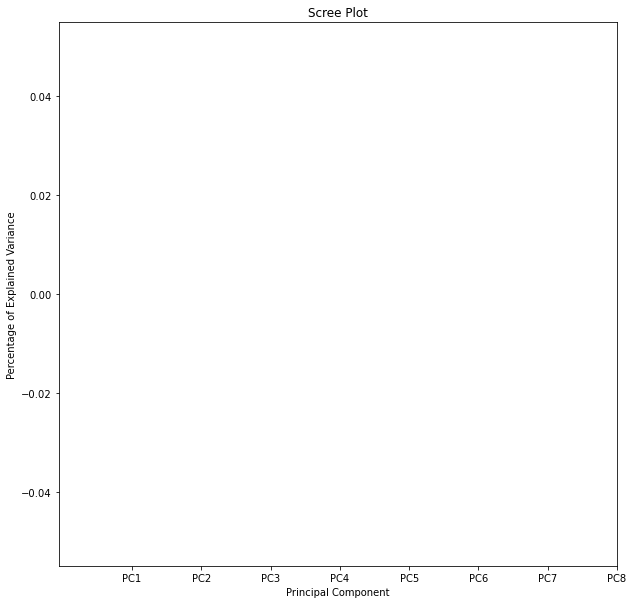

embedding1    1.0
embedding8    0.0
embedding7    0.0
dtype: float32


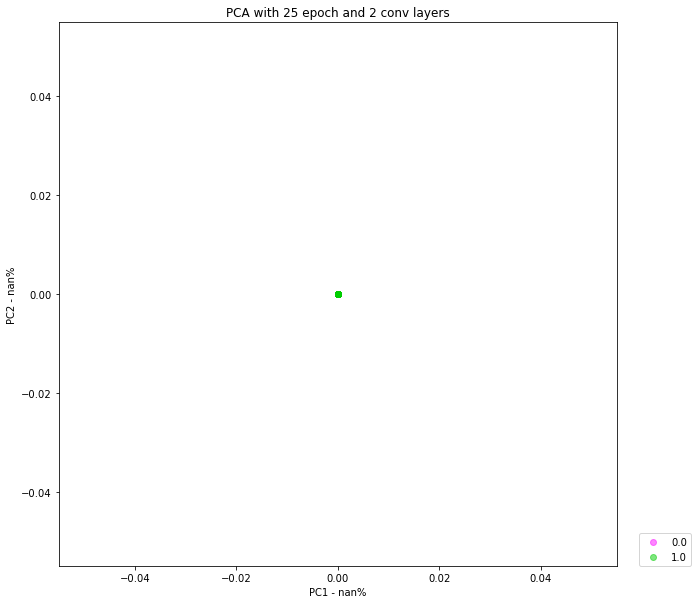

In [63]:
out_features_size = 8
model.eval()
with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

plot_PCA(embeddings, flatten_labels, out_features_size=8,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=False, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

# Ball labels as Circle

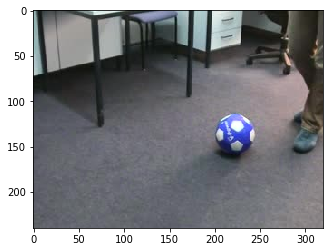

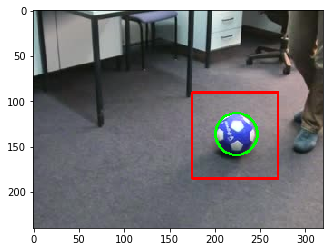

In [50]:
img_path = "./data/Vid_A_ball/img0002.jpg"

#Import image
orig_image = cv2.imread(img_path)
#Show the image with matplotlib
start_point = (200, 115)   
end_point = (245, 160)
center_coordinates = (224, 136)
radius = 23
padding = 25
start_point_pad = (start_point[0]-padding, start_point[1]-padding)
end_point_pad = (end_point[0]+padding, end_point[1]+padding)
# Blue color in BGR 
color = (0, 255, 0) 
color_pad = (255, 0, 0)
# Line thickness of 2 px 
thickness = 2
image = orig_image.copy()
image = cv2.circle(image, center_coordinates, radius, color, thickness) 
image = cv2.rectangle(image, start_point_pad, end_point_pad, color_pad, thickness) 

#Show the image with matplotlib
plt.imshow(orig_image)
plt.show()
plt.imshow(image)
plt.show()

(240, 320)


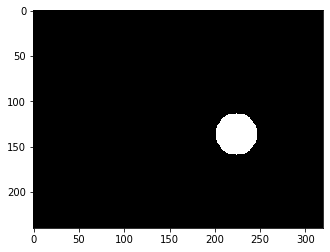

In [59]:
# label image
image_labels = np.zeros((orig_image.shape[0], orig_image.shape[1]))
color = (255, 255, 255) 
thickness = -1
image_labels = cv2.circle(image_labels, center_coordinates, radius, color, thickness) 
# image_labels = cv2.rectangle(image_labels, start_point_pad, end_point_pad, color_pad, thickness) 
print(image_labels.shape)

plt.imshow(image_labels, cmap=plt.cm.gray)
plt.show()

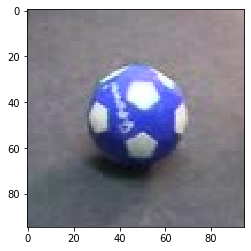

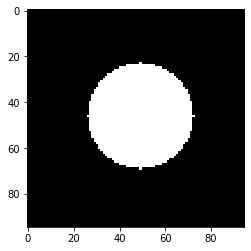

torch.Size([95, 95])
torch.Size([1, 3, 95, 95])
torch.Size([9025])


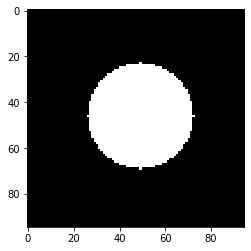

tensor([2234, 2323, 2324,  ..., 6514, 6515, 6604])
tensor([   0,    1,    2,  ..., 9022, 9023, 9024])


In [67]:
import torch

img = orig_image[start_point_pad[1]:end_point_pad[1], start_point_pad[0]:end_point_pad[0]]
plt.imshow(img)
plt.show()

labels = image_labels[start_point_pad[1]:end_point_pad[1], start_point_pad[0]:end_point_pad[0]]
plt.imshow(labels, cmap=plt.cm.gray)
plt.show()

img = np.moveaxis(img, -1, 0)
img = torch.tensor(img)
img = img.float()
img = img.unsqueeze(0)
labels = torch.tensor(labels)

print(labels.shape)
print(img.shape)
flatten_labels = labels.view(-1)
print(flatten_labels.shape)

test_flatten_labels = flatten_labels.reshape((labels.shape[0], labels.shape[1]))

flatten_labels[flatten_labels==255] = 1.
foreground = torch.where(flatten_labels == 1.)[0]
background = torch.where(flatten_labels == 0)[0]

plt.imshow(test_flatten_labels, cmap=plt.cm.gray)
plt.show()

print(foreground)
print(background)

In [70]:
import torch.optim as optim

last_out_channel = 256
model = EmbeddingNet6(last_out_channel)
lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)
margin = 20000.
criterion = TripletLoss(margin)
n_epochs = 20

In [71]:
model = train_model(model, criterion, img, flatten_labels, optimizer, foreground, background, num_epochs=n_epochs, batch_size=95, num_batches=95)

Epochs:   5%|▌         | 1/20 [01:35<30:12, 95.40s/it]

loss: 19836.201172


Epochs:  10%|█         | 2/20 [03:10<28:35, 95.28s/it]

loss: 19522.933594


Epochs:  15%|█▌        | 3/20 [04:45<26:57, 95.17s/it]

loss: 19208.818359


Epochs:  20%|██        | 4/20 [06:20<25:23, 95.20s/it]

loss: 18890.082031


Epochs:  25%|██▌       | 5/20 [07:55<23:48, 95.25s/it]

loss: 18573.705078


Epochs:  30%|███       | 6/20 [09:31<22:13, 95.27s/it]

loss: 18253.728516


Epochs:  35%|███▌      | 7/20 [11:06<20:36, 95.13s/it]

loss: 17930.570312


Epochs:  40%|████      | 8/20 [12:40<18:59, 94.97s/it]

loss: 17608.384766


Epochs:  45%|████▌     | 9/20 [14:15<17:24, 94.94s/it]

loss: 17284.224609


Epochs:  50%|█████     | 10/20 [15:50<15:48, 94.83s/it]

loss: 16953.429688


Epochs:  55%|█████▌    | 11/20 [17:25<14:14, 94.98s/it]

loss: 16629.751953


Epochs:  60%|██████    | 12/20 [18:56<12:31, 93.93s/it]

loss: 16310.252930


Epochs:  65%|██████▌   | 13/20 [20:28<10:52, 93.16s/it]

loss: 15983.517578


Epochs:  70%|███████   | 14/20 [21:59<09:15, 92.60s/it]

loss: 15658.684570


Epochs:  75%|███████▌  | 15/20 [23:30<07:41, 92.23s/it]

loss: 15333.469727


Epochs:  80%|████████  | 16/20 [25:02<06:07, 91.95s/it]

loss: 14998.300781


Epochs:  85%|████████▌ | 17/20 [26:33<04:35, 91.78s/it]

loss: 14690.052734


Epochs:  90%|█████████ | 18/20 [28:06<03:03, 91.95s/it]

loss: 14353.949219


Epochs:  95%|█████████▌| 19/20 [29:40<01:32, 92.58s/it]

loss: 14025.445312


Epochs: 100%|██████████| 20/20 [31:13<00:00, 93.68s/it]

loss: 13687.754883
Best val loss: 13687.754883


In [72]:
out_features_size = last_out_channel
model.eval()

with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    model = model.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

c, w = 0, 0
for i in embeddings:
    if np.array_equal(i, np.array([0.]*out_features_size)):
        c += 1
    else:
        w += 1
#     print(i)    
print("zeros count:", c)
print("not zeros count:", w)

embeddings.shape: (9025, 256)
flatten_labels.shape: torch.Size([9025])
zeros count: 0
not zeros count: 9025


correct: 9017, wrong: 8, accuracy: 99.91135734072022%


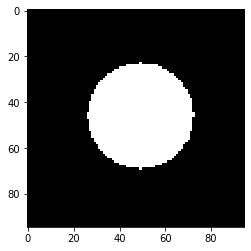

tensor([23, 24, 24,  ..., 68, 68, 69])
tensor([2234, 2323, 2324,  ..., 6514, 6515, 6604])


In [81]:
centroids = get_centroids(embeddings, foreground, background)
# print("centroids:", centroids)
heat_map = embeddings_accuracy(embeddings, flatten_labels, labels.shape, centroids, num_classes=2)
# t = .view(-1)
t = torch.tensor(heat_map)
foreground2 = torch.where(t == 1)[0]
plt.imshow(heat_map, cmap=plt.cm.gray)
plt.show()
print(foreground2)
print(foreground)

In [77]:
model_path = 'circled_labels_model6_1'
torch.save(model.state_dict(), model_path+'.pt')

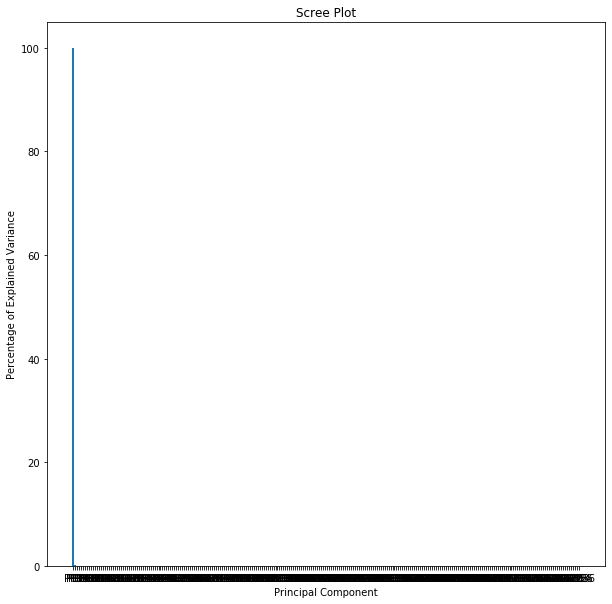

embedding185    0.062516
embedding131    0.062515
embedding219    0.062515
dtype: float64


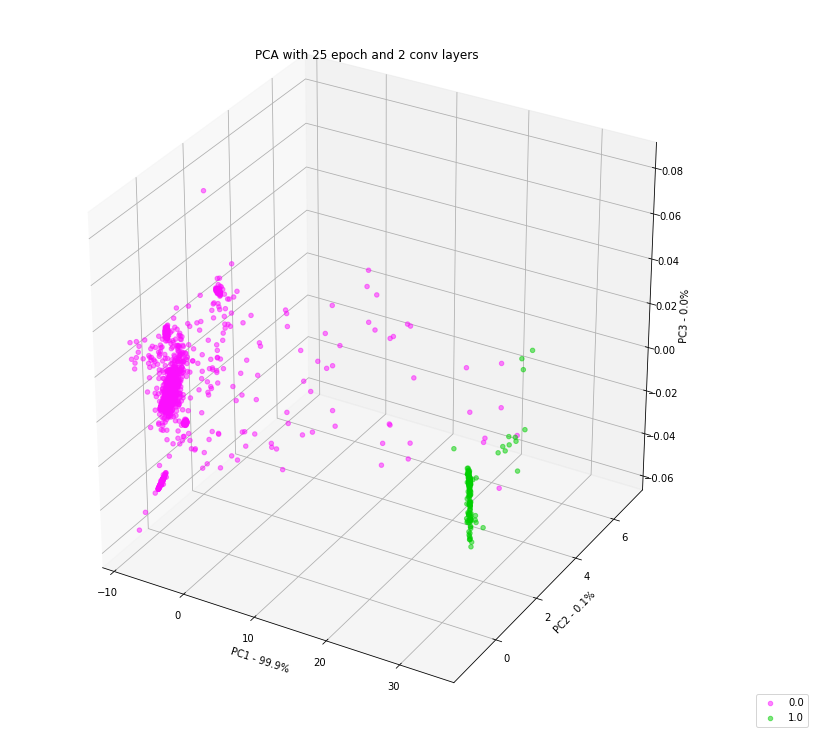

In [75]:
plot_PCA(embeddings, flatten_labels, out_features_size=out_features_size,classes= [0., 1.], colors=['#fc0fff', '#00cf00'], is_3D=True, pca_title='PCA with 25 epoch and 2 conv layers', draw_PCA_per_varc=True, figure_size=(10,10), top_range_loadingfactors=(0, 3))

## Save Centroids

In [100]:
centroid_path = model_path + '_centroids' + '.pkl'


In [101]:
model_path = 'model5_3'
centroid_path = 'Centroids/' + model_path + '_centroids' + '.pkl'

In [102]:
import torch.optim as optim
last_out_channel = 256
model = EmbeddingNet5(last_out_channel)

In [105]:
model.load_state_dict(torch.load('Models/'+model_path+'.pt'))

<All keys matched successfully>

In [106]:
out_features_size = last_out_channel
model.eval()

with torch.set_grad_enabled(False):
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    img = img.to(device)
    model = model.to(device)
    embeddings = model(img)
embeddings = embeddings.data.cpu().numpy()
print("embeddings.shape:", embeddings.shape) # Datafram will contain 9025 rows and 8 col 
print("flatten_labels.shape:", flatten_labels.shape)

c, w = 0, 0
for i in embeddings:
    if np.array_equal(i, np.array([0.]*out_features_size)):
        c += 1
    else:
        w += 1
#     print(i)    
print("zeros count:", c)
print("not zeros count:", w)

embeddings.shape: (9025, 256)
flatten_labels.shape: torch.Size([9025])
zeros count: 1691
not zeros count: 7334


correct: 8567, wrong: 458, accuracy: 94.92520775623268%


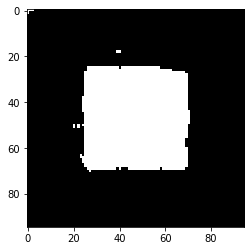

In [107]:
centroids = get_centroids(embeddings, foreground, background)
heat_map = embeddings_accuracy(embeddings, flatten_labels, labels.shape, centroids, num_classes=2)
plt.imshow(heat_map, cmap=plt.cm.gray)
plt.show()

In [108]:
save_centroids(centroid_path)
centroids_af = load_centroids(centroid_path)
assert np.array_equal(centroids_af, centroids)